In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pycbc.waveform
from pycbc.types import TimeSeries
from scipy.interpolate import interp1d
from pycbc.psd import aLIGOZeroDetHighPower
from pycbc.filter import match
import h5py
from pycbc.workflow import WorkflowConfigParser
from pycbc.inference.models import read_from_config
import pycbc.conversions
import corner

In [6]:
F_vmax = h5py.File("combine_results_vmax.hdf", "r")
F_vmax.keys()

<KeysViewHDF5 ['results']>

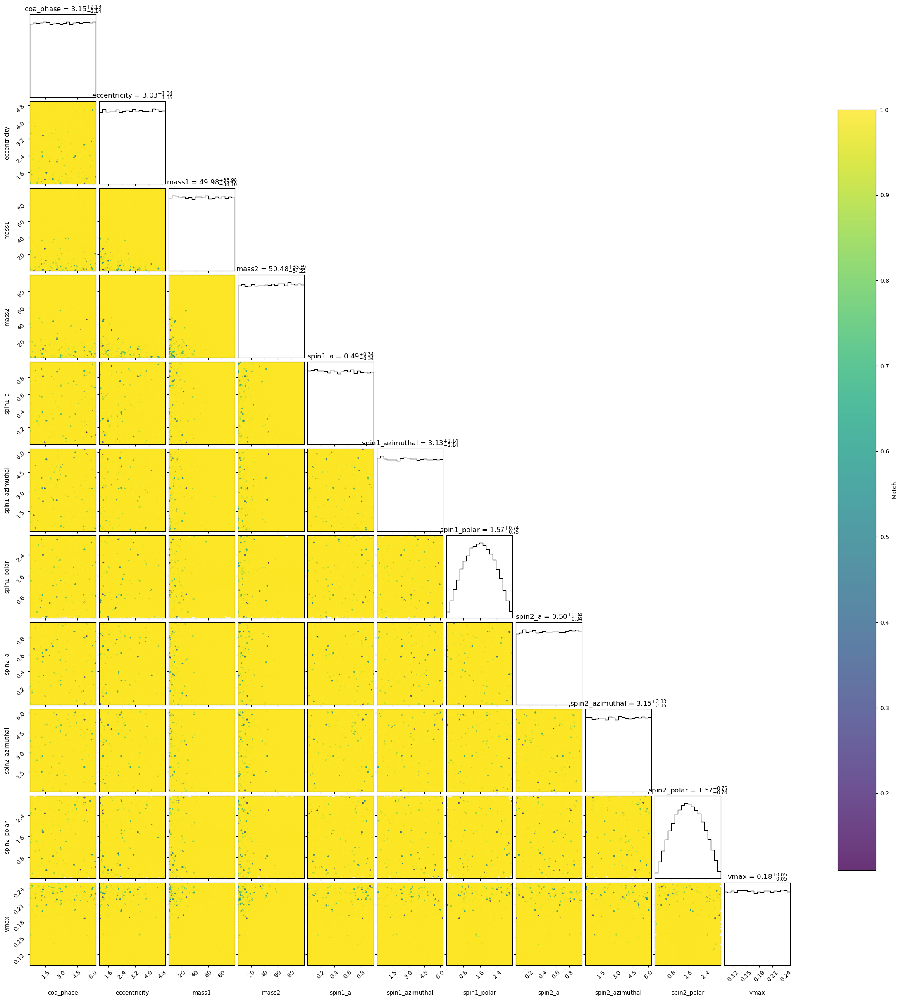

In [7]:
n = 100000
#mask = F_vmax['results']['vmax'][:n] < 0.25
params = {
    'coa_phase': F_vmax['results']['coa_phase'][:n],
    'eccentricity': F_vmax['results']['eccentricity'][:n],
    'mass1': F_vmax['results']['mass1'][:n],
    'mass2': F_vmax['results']['mass2'][:n],
    'spin1_a': F_vmax['results']['spin1_a'][:n],
    'spin1_azimuthal': F_vmax['results']['spin1_azimuthal'][:n],
    'spin1_polar': F_vmax['results']['spin1_polar'][:n],
    'spin2_a': F_vmax['results']['spin2_a'][:n],
    'spin2_azimuthal': F_vmax['results']['spin2_azimuthal'][:n],
    'spin2_polar': F_vmax['results']['spin2_polar'][:n],
    'vmax': F_vmax['results']['vmax'][:n],
}

 
data = np.column_stack([params[k] for k in params.keys()])
labels = list(params.keys())

 
figure = corner.corner(
    data,
    labels=labels,
    show_titles=True,
    plot_datapoints=True,
    fill_contours=False,
    no_fill_contours=True,   
    plot_contours=False
)

 
axes = np.array(figure.axes).reshape((len(labels), len(labels)))
for i in range(len(labels)):
    for j in range(len(labels)):
        if i > j:  # only lower-triangle scatter plots
            ax = axes[i, j]
            sc = ax.scatter(data[:, j], data[:, i], 
                            c=F_vmax['results']['match'][:n], cmap="viridis", s=5, alpha=0.8)

 
fig = plt.gcf()
cbar = fig.colorbar(sc, ax=axes, location="right", shrink=0.8)
cbar.set_label("Match")

plt.show()

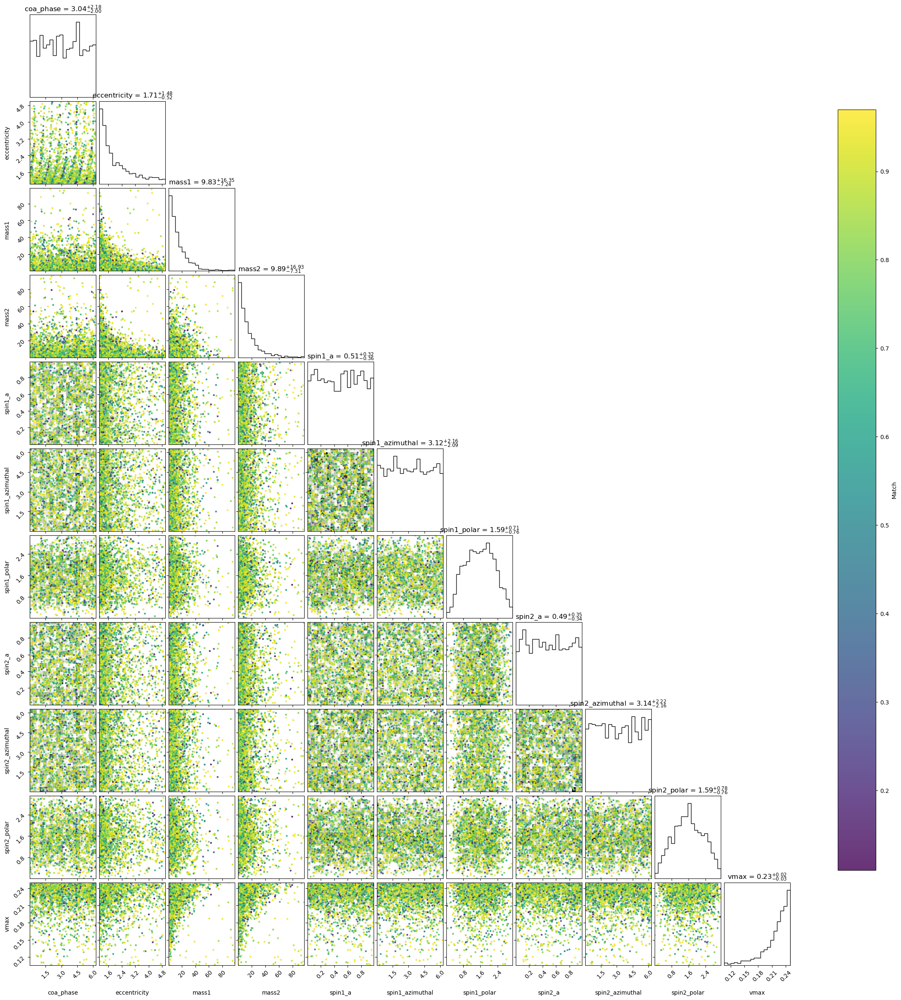

In [8]:
n = 100000
mask = F_vmax['results']['match'][:n] < 0.97
params = {
    'coa_phase': F_vmax['results']['coa_phase'][:n][mask],
    'eccentricity': F_vmax['results']['eccentricity'][:n][mask],
    'mass1': F_vmax['results']['mass1'][:n][mask],
    'mass2': F_vmax['results']['mass2'][:n][mask],
    'spin1_a': F_vmax['results']['spin1_a'][:n][mask],
    'spin1_azimuthal': F_vmax['results']['spin1_azimuthal'][:n][mask],
    'spin1_polar': F_vmax['results']['spin1_polar'][:n][mask],
    'spin2_a': F_vmax['results']['spin2_a'][:n][mask],
    'spin2_azimuthal': F_vmax['results']['spin2_azimuthal'][:n][mask],
    'spin2_polar': F_vmax['results']['spin2_polar'][:n][mask],
    'vmax': F_vmax['results']['vmax'][:n][mask],
}

 
data = np.column_stack([params[k] for k in params.keys()])
labels = list(params.keys())

 
figure = corner.corner(
    data,
    labels=labels,
    show_titles=True,
    plot_datapoints=True,
    fill_contours=False,
    no_fill_contours=True,   
    plot_contours=False
)

 
axes = np.array(figure.axes).reshape((len(labels), len(labels)))
for i in range(len(labels)):
    for j in range(len(labels)):
        if i > j:  # only lower-triangle scatter plots
            ax = axes[i, j]
            sc = ax.scatter(data[:, j], data[:, i], 
                            c=F_vmax['results']['match'][:n][mask], cmap="viridis", s=5, alpha=0.8)

 
fig = plt.gcf()
cbar = fig.colorbar(sc, ax=axes, location="right", shrink=0.8)
cbar.set_label("Match")

plt.show()

In [9]:
sum(F_vmax['results']['match'][:] < 0.97)/sum(F_vmax['results']['match'][:])

np.float64(0.01663485311293762)

In [10]:
F_vmax200k = h5py.File("combine_results_vmax200k.hdf", "r")
F_vmax200k.keys()

len(F_vmax200k['results']['mass1'][:])

200000

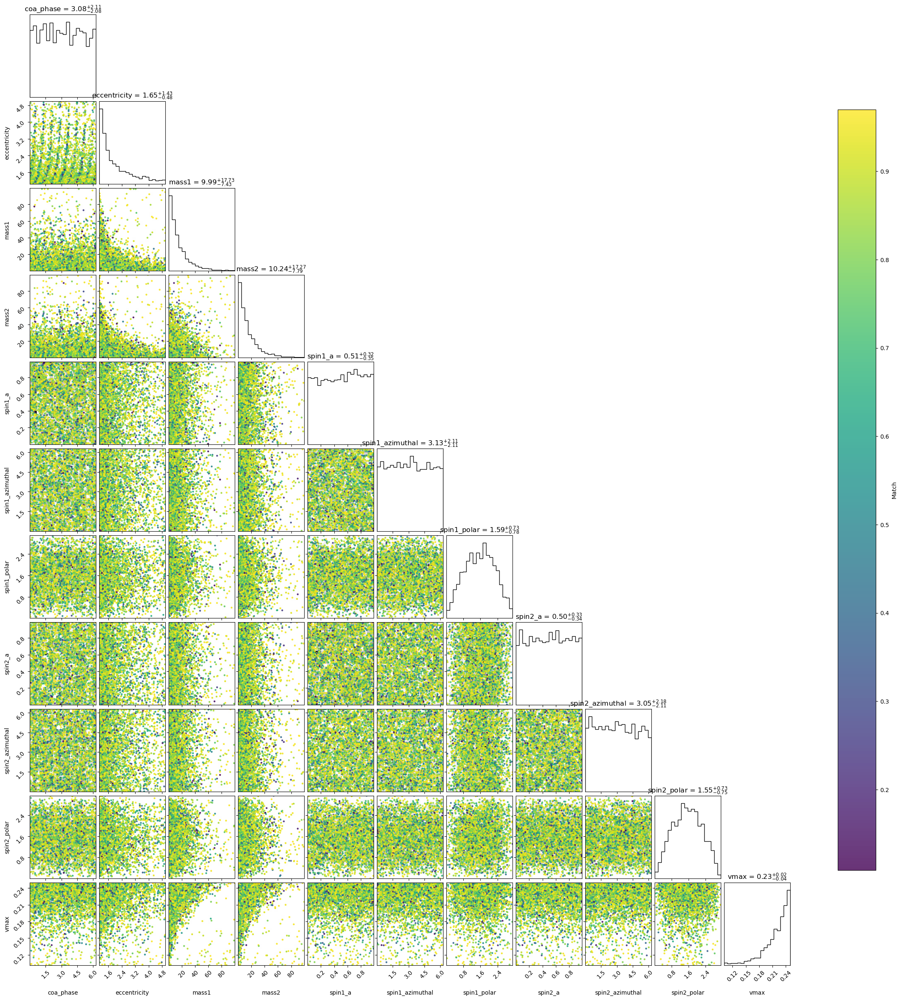

In [11]:
n = 200000
mask = F_vmax200k['results']['match'][:n] < 0.97
params = {
    'coa_phase': F_vmax200k['results']['coa_phase'][:n][mask],
    'eccentricity': F_vmax200k['results']['eccentricity'][:n][mask],
    'mass1': F_vmax200k['results']['mass1'][:n][mask],
    'mass2': F_vmax200k['results']['mass2'][:n][mask],
    'spin1_a': F_vmax200k['results']['spin1_a'][:n][mask],
    'spin1_azimuthal': F_vmax200k['results']['spin1_azimuthal'][:n][mask],
    'spin1_polar': F_vmax200k['results']['spin1_polar'][:n][mask],
    'spin2_a': F_vmax200k['results']['spin2_a'][:n][mask],
    'spin2_azimuthal': F_vmax200k['results']['spin2_azimuthal'][:n][mask],
    'spin2_polar': F_vmax200k['results']['spin2_polar'][:n][mask],
    'vmax': F_vmax200k['results']['vmax'][:n][mask],
}

 
data = np.column_stack([params[k] for k in params.keys()])
labels = list(params.keys())

 
figure = corner.corner(
    data,
    labels=labels,
    show_titles=True,
    plot_datapoints=True,
    fill_contours=False,
    no_fill_contours=True,   
    plot_contours=False
)

 
axes = np.array(figure.axes).reshape((len(labels), len(labels)))
for i in range(len(labels)):
    for j in range(len(labels)):
        if i > j:  # only lower-triangle scatter plots
            ax = axes[i, j]
            sc = ax.scatter(data[:, j], data[:, i], 
                            c=F_vmax200k['results']['match'][:n][mask], cmap="viridis", s=5, alpha=0.8)

 
fig = plt.gcf()
cbar = fig.colorbar(sc, ax=axes, location="right", shrink=0.8)
cbar.set_label("Match")

plt.show()

In [12]:
sum(F_vmax200k['results']['match'][:] < 0.97)/sum(F_vmax200k['results']['match'][:])

np.float64(0.0173487715748911)

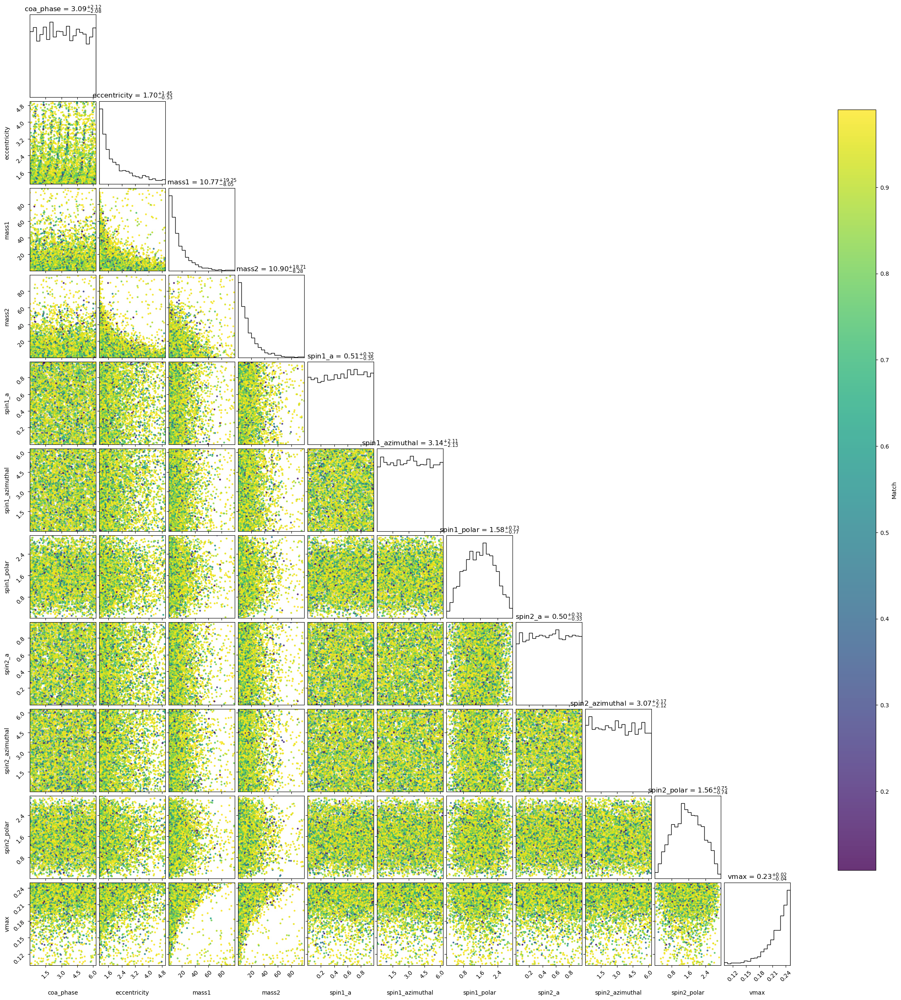

In [13]:
n = 200000
mask = F_vmax200k['results']['match'][:n] < 0.99
params = {
    'coa_phase': F_vmax200k['results']['coa_phase'][:n][mask],
    'eccentricity': F_vmax200k['results']['eccentricity'][:n][mask],
    'mass1': F_vmax200k['results']['mass1'][:n][mask],
    'mass2': F_vmax200k['results']['mass2'][:n][mask],
    'spin1_a': F_vmax200k['results']['spin1_a'][:n][mask],
    'spin1_azimuthal': F_vmax200k['results']['spin1_azimuthal'][:n][mask],
    'spin1_polar': F_vmax200k['results']['spin1_polar'][:n][mask],
    'spin2_a': F_vmax200k['results']['spin2_a'][:n][mask],
    'spin2_azimuthal': F_vmax200k['results']['spin2_azimuthal'][:n][mask],
    'spin2_polar': F_vmax200k['results']['spin2_polar'][:n][mask],
    'vmax': F_vmax200k['results']['vmax'][:n][mask],
}

 
data = np.column_stack([params[k] for k in params.keys()])
labels = list(params.keys())

 
figure = corner.corner(
    data,
    labels=labels,
    show_titles=True,
    plot_datapoints=True,
    fill_contours=False,
    no_fill_contours=True,   
    plot_contours=False
)

 
axes = np.array(figure.axes).reshape((len(labels), len(labels)))
for i in range(len(labels)):
    for j in range(len(labels)):
        if i > j:  # only lower-triangle scatter plots
            ax = axes[i, j]
            sc = ax.scatter(data[:, j], data[:, i], 
                            c=F_vmax200k['results']['match'][:n][mask], cmap="viridis", s=5, alpha=0.8)

 
fig = plt.gcf()
cbar = fig.colorbar(sc, ax=axes, location="right", shrink=0.8)
cbar.set_label("Match")

plt.show()

In [14]:
sum(F_vmax200k['results']['match'][:] < 0.99)/sum(F_vmax200k['results']['match'][:])

np.float64(0.02264978511166338)